In [9]:
from pathlib import Path

PICTURES_ROOT = Path(r"test_images")

# case-insensitive .jpg scan. HEIC and MOV files are skipped for now —
# cv2.imread doesn't decode HEIC out of the box, and MOVs are video.
personal_imgs = sorted(
    p for p in PICTURES_ROOT.rglob("*")
    if p.suffix.lower() in {".jpg", ".jpeg"}
)

print(f"found {len(personal_imgs)} JPGs under {PICTURES_ROOT}")
for p in personal_imgs[:5]:
    print(" ", p)

found 1000 JPGs under test_images
  test_images\200504_a\IMG_7129.JPG
  test_images\201112_a\IMG_2090.JPG
  test_images\201112_a\IMG_2091.JPG
  test_images\201112_a\IMG_2093.JPG
  test_images\201112_a\IMG_2094.JPG


In [10]:
from utils import * 

Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\jakel/.insightface\models\buffalo_l\1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\jakel/.insightface\models\buffalo_l\2d106det.onnx landmark_2d_106 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\jakel/.insightface\models\buffalo_l\det_10g.onnx detection [1, 3, '?', '?'] 127.5 128.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\jakel/.insightface\models\buffalo_l\genderage.onnx genderage ['None', 3, 96, 96] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\jakel/.insightface\models\buffalo_l\w600k_r50.onnx recognition ['None', 3, 112, 112] 127.

In [11]:
personal_imgs = personal_imgs[:1000]  # limit to 1000 for testing

In [10]:
# Picture-centric storage: each photo maps to a (k, 512) array of every
# face embedding detected in it. Photos with no detectable face are absent
# from the index. Use `flatten_face_index(face_index)` to feed clustering.
face_index = extract_face_index(personal_imgs)

n_faces = sum(len(v) for v in face_index.values())
print(f"{n_faces} faces extracted from {len(face_index)} photos "
      f"({len(personal_imgs) - len(face_index)} photos had no detectable face)")

# Quick sanity check: peek at the first indexed photo.
first_path = next(iter(face_index))
print(f"{first_path.name}: {face_index[first_path].shape[0]} face(s)")

100%|██████████| 1000/1000 [47:03<00:00,  2.82s/it] 

5082 faces extracted from 897 photos (103 photos had no detectable face)
IMG_7129.JPG: 1 face(s)


In [11]:
import pickle
from pathlib import Path

# Strip the os-specific Path class — store keys as plain strings for portability.
# Relative paths (test_images/200504_a/IMG_7129.JPG) reload fine on Windows.
serializable = {str(p): emb for p, emb in face_index.items()}

OUT = Path("face_index.pkl")
with OUT.open("wb") as f:
    pickle.dump(serializable, f)

n_photos = len(serializable)
n_faces  = sum(len(v) for v in serializable.values())
print(f"saved {n_photos} photos / {n_faces} embeddings → {OUT} ({OUT.stat().st_size/1e6:.1f} MB)")

# Pop a download prompt in the browser
from google.colab import files
files.download(str(OUT))


saved 897 photos / 5082 embeddings → face_index.pkl (10.5 MB)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import base64
from pathlib import Path
from IPython.display import HTML

OUT = Path("face_index.pkl")
b64 = base64.b64encode(OUT.read_bytes()).decode()
size_mb = OUT.stat().st_size / 1e6

HTML(
    f'<a download="{OUT.name}" '
    f'href="data:application/octet-stream;base64,{b64}">'
    f'⬇ Download {OUT.name} ({size_mb:.1f} MB)</a>'
)


In [12]:
import pickle
from pathlib import Path

with open("face_index.pkl", "rb") as f:
    raw = pickle.load(f)

# Reconstitute string keys as Path objects (will be WindowsPath/PosixPath
# depending on the OS you're loading on — that's the whole reason we
# saved as strings in the first place).
face_index = {Path(p): emb for p, emb in raw.items()}

n_photos = len(face_index)
n_faces  = sum(len(v) for v in face_index.values())
print(f"loaded {n_photos} photos / {n_faces} embeddings from face_index.pkl")

# Peek at the first entry
first_path = next(iter(face_index))
print(f"  example — {first_path}: shape {face_index[first_path].shape}")


loaded 897 photos / 5082 embeddings from face_index.pkl
  example — test_images\200504_a\IMG_7129.JPG: shape (1, 512)


In [13]:
print(face_index[personal_imgs[0]])

[[-7.17008710e-02 -3.76210595e-03 -2.63246452e-03 -2.56565399e-02
   2.10724268e-02  7.14364573e-02 -2.66637113e-02 -1.87386828e-03
  -2.66936980e-03  8.81879870e-03  6.48697512e-03 -2.08857730e-02
  -3.99311190e-04  2.79068053e-02 -4.88317981e-02 -1.42471853e-03
   9.45197120e-02 -5.32219652e-03 -9.50040296e-02 -1.24704465e-03
  -2.40996554e-02  4.40926552e-02  6.89218491e-02 -1.87122170e-02
   5.60046695e-02 -2.15040203e-02 -3.66729684e-02  4.78484333e-02
  -6.44261613e-02 -1.17605105e-02 -3.93163152e-02 -3.54146090e-04
   6.83601126e-02  3.21688540e-02  4.54567336e-02  9.61070359e-02
   3.33429161e-05  2.08907039e-03  1.00622848e-01  2.59470157e-02
  -9.99757927e-03 -4.74497937e-02 -1.01634987e-01  3.92136462e-02
  -2.11409610e-02  1.00871930e-02 -2.24640351e-02 -6.87080771e-02
  -9.23730619e-03 -3.81730162e-02  9.99919511e-03  2.25527436e-02
  -4.80712093e-02  3.32351550e-02  2.77040564e-02 -5.26660457e-02
   1.13704398e-01  7.07172006e-02 -5.29665919e-03  4.71298322e-02
   4.20917

In [15]:
EPS = 0.45              # cosine-distance threshold — lower = stricter "same person"
MIN_SAMPLES = 3         # a face needs ≥3 close neighbors to seed a cluster
MATCH_THRESHOLD = 0.30  # cosine-sim cutoff when re-assigning every face to a centroid

# Flat (M, 512) form is what DBSCAN expects.
embeddings, source_paths = flatten_face_index(face_index)

# Cluster faces, then centroid-per-cluster: averaging multiple shots of the same
# person cancels per-image noise and sharpens downstream matches.
cluster_ids              = cluster_faces(embeddings, eps=EPS, min_samples=MIN_SAMPLES)
prototypes, cluster_keys = build_prototypes(embeddings, cluster_ids)

# Re-assign every face (including DBSCAN noise) to its nearest prototype.
# Returns {person_idx: [photo paths]} with -1 reserved for below-threshold matches.
album = photos_by_person(embeddings, source_paths, prototypes, threshold=MATCH_THRESHOLD)

# 2-D list: row i = all photos containing person i (the person at prototypes[i]).
people_photos = [album.get(i, []) for i in range(len(prototypes))]

n_faces        = len(embeddings)
n_unclustered  = int((cluster_ids == -1).sum())
n_orphan_pics  = len(album.get(-1, []))

print(f"{len(people_photos)} unique people identified from {n_faces} face detections")
print(f"  {n_unclustered} faces too sparse to cluster ({n_unclustered/n_faces:.1%})")
print(f"  {n_orphan_pics} photos contain ≥1 face that didn't confidently match anyone")
print()
for i, photos in enumerate(people_photos[:5]):
    print(f"  person {i}: {len(photos)} photos — e.g. {photos[0].name if photos else '(none)'}")


161 unique people identified from 5082 face detections
  2498 faces too sparse to cluster (49.2%)
  457 photos contain ≥1 face that didn't confidently match anyone

  person 0: 27 photos — e.g. IMG_2090.JPG
  person 1: 45 photos — e.g. IMG_2090.JPG
  person 2: 244 photos — e.g. IMG_2091.JPG
  person 3: 35 photos — e.g. IMG_2096.JPG
  person 4: 80 photos — e.g. IMG_2105.JPG


In [16]:
people_photos = sorted(people_photos, key=len, reverse=True)[:10]

print(f"\ntop 10 most-photographed people:")
for i, photos in enumerate(people_photos):
    print(f"  person {i}: {len(photos)} photos")



top 10 most-photographed people:
  person 0: 429 photos
  person 1: 244 photos
  person 2: 80 photos
  person 3: 67 photos
  person 4: 61 photos
  person 5: 57 photos
  person 6: 56 photos
  person 7: 55 photos
  person 8: 52 photos
  person 9: 50 photos


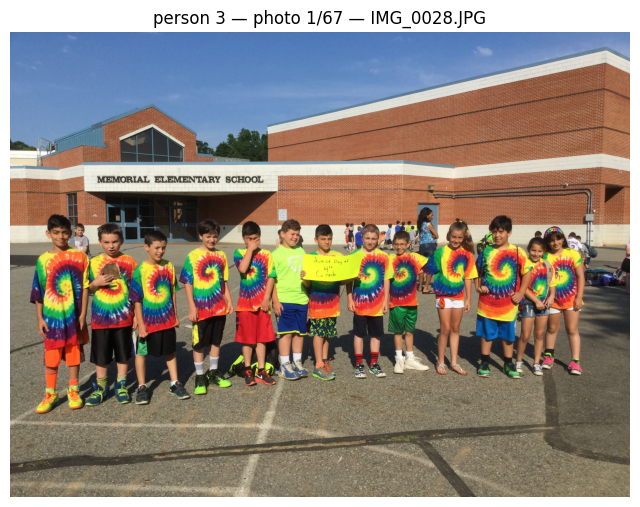

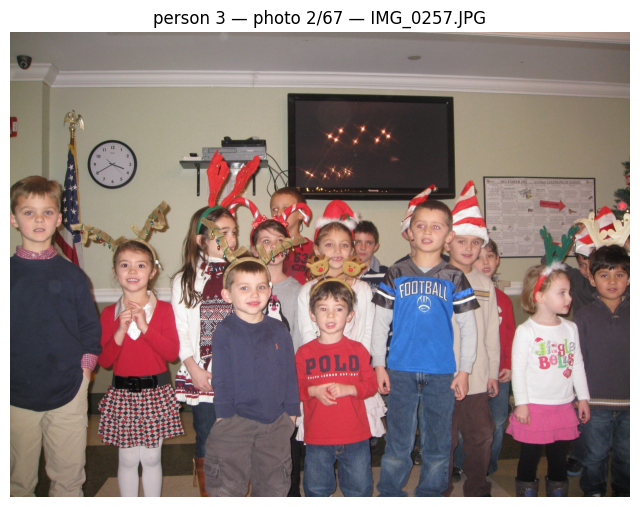

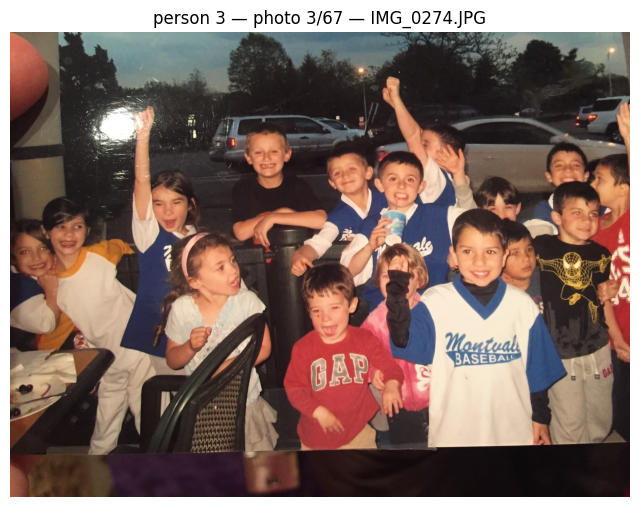

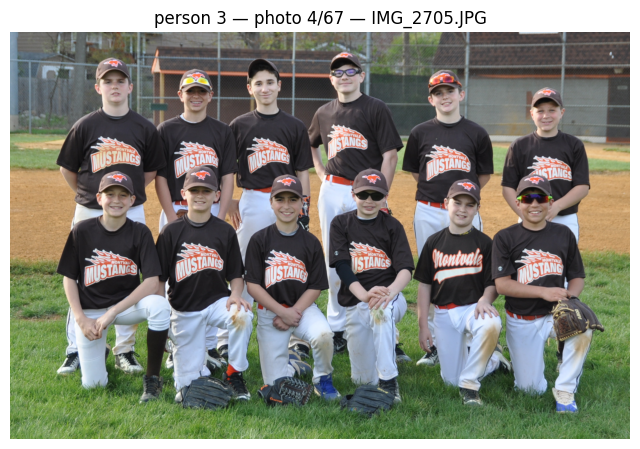

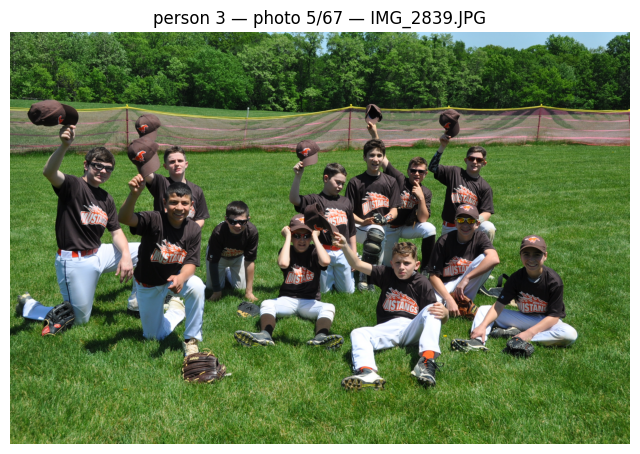

...

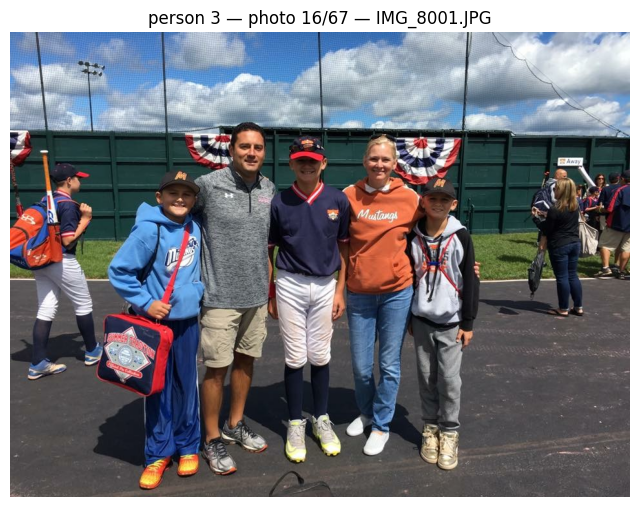

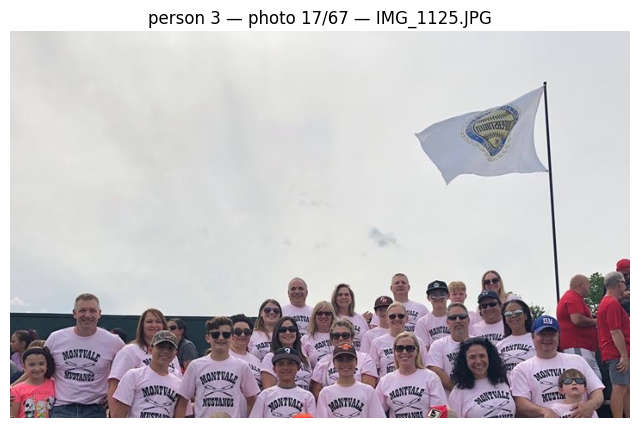

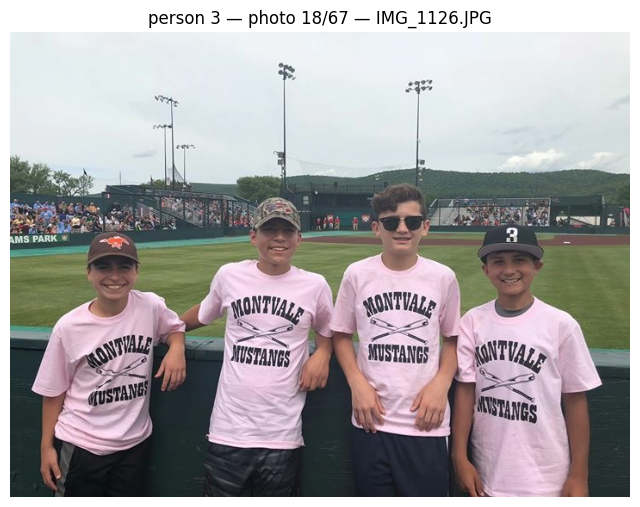

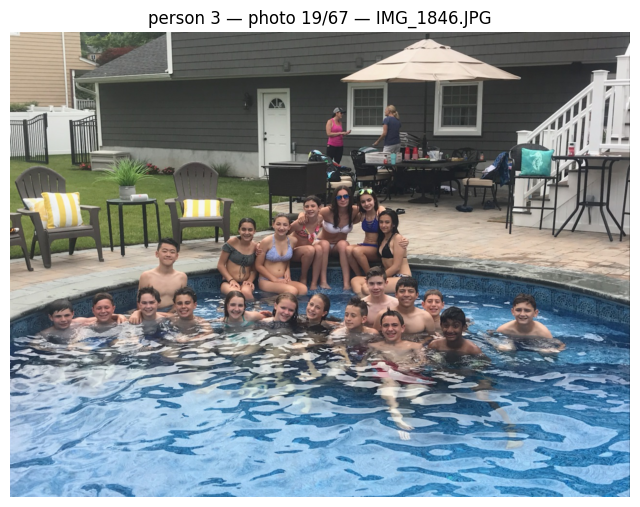

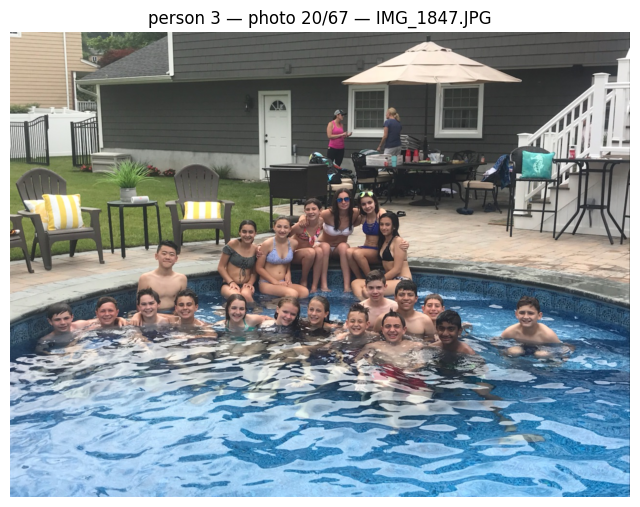

In [17]:
def show_person_photo(person_idx: int, photo_idx: int) -> None:
    """Display photo #photo_idx of the person ranked #person_idx in top-10."""
    photos = people_photos[person_idx]
    if not (0 <= photo_idx < len(photos)):
        raise IndexError(
            f"person {person_idx} has {len(photos)} photos (asked for index {photo_idx})"
        )
    path = photos[photo_idx]
    img = load_image(path)
    if img is None:
        raise FileNotFoundError(f"could not load {path}")
    show_image(img, title=f"person {person_idx} — photo {photo_idx+1}/{len(photos)} — {path.name}")


# Example
for i in range(20):
    show_person_photo(3, i)

In [ ]:
def show_unmatched_photos(n: int = 9, cols: int = 3) -> None:
    """Grid of first n photos with ≥1 unmatched face.
    Red box = face that didn't meet MATCH_THRESHOLD, green = matched.
    Score above each box is its cosine sim to the nearest prototype.
    """
    paths = album.get(-1, [])[:n]
    if not paths:
        print("no unmatched-face photos")
        return

    rows = (len(paths) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(4 * cols, 4 * rows))
    axes = axes.flatten() if rows * cols > 1 else [axes]

    for ax, path in zip(axes, paths):
        img = load_image(path)
        if img is None:
            ax.set_title(f"missing: {path.name}")
            ax.axis("off")
            continue

        # Re-detect to recover bboxes (face_index only stored embeddings).
        # Score each face against prototypes; red if below MATCH_THRESHOLD.
        faces = get_faces(img)
        if faces:
            embs   = np.stack([f.normed_embedding for f in faces])
            scores = (embs @ prototypes.T).max(axis=1)
            for f, score in zip(faces, scores):
                x1, y1, x2, y2 = f.bbox.astype(int)
                color = (0, 0, 255) if score < MATCH_THRESHOLD else (0, 255, 0)  # BGR
                cv2.rectangle(img, (x1, y1), (x2, y2), color, 3)
                cv2.putText(img, f"{score:.2f}", (x1, max(0, y1 - 8)),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)

        ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax.set_title(path.name, fontsize=9)
        ax.axis("off")

    for ax in axes[len(paths):]:
        ax.axis("off")

    plt.suptitle(
        f"{len(paths)} of {len(album.get(-1, []))} photos with ≥1 unmatched face — "
        f"red = below {MATCH_THRESHOLD:.2f} sim",
        y=1.02,
    )
    plt.tight_layout()
    plt.show()


show_unmatched_photos(9)


In [1]:
!pip install open_clip_torch torch torchvision pillow

   ---------------------------------------- 0.0/1.5 MB ? eta -:--:--
   ---------------------------------------- 0.0/1.5 MB ? eta -:--:--
   ---------------------------------------- 0.0/1.5 MB ? eta -:--:--
   ---------------------------------------- 0.0/1.5 MB ? eta -:--:--
   ---------------------------------------- 0.0/1.5 MB ? eta -:--:--
   ---------------------------------------- 0.0/1.5 MB ? eta -:--:--
   ---------------------------------------- 0.0/1.5 MB ? eta -:--:--
   ------ --------------------------------- 0.3/1.5 MB ? eta -:--:--
   ------ --------------------------------- 0.3/1.5 MB ? eta -:--:--
   ------ --------------------------------- 0.3/1.5 MB ? eta -:--:--
   ------ --------------------------------- 0.3/1.5 MB ? eta -:--:--
   ------ --------------------------------- 0.3/1.5 MB ? eta -:--:--
   ------------- -------------------------- 0.5/1.5 MB 284.6 kB/s eta 0:00:04
   ------------- -------------------------- 0.5/1.5 MB 284.6 kB/s eta 0:00:04
   -------------


[notice] A new release of pip is available: 25.3 -> 26.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
import torch
import open_clip

In [3]:
device = "cuda" if torch.cuda.is_available() else "cpu"

# ViT-B/32 OpenAI weights — 512-d, ~150 MB, runs fine on CPU.
# Swap to "ViT-L-14" / "laion2b_s32b_b82k" for better retrieval at 3× the size.
model, _, _ = open_clip.create_model_and_transforms("ViT-B-32", pretrained="openai")
tokenizer   = open_clip.get_tokenizer("ViT-B-32")
model       = model.to(device).eval()

text = "Birthday Party"
tokens = tokenizer([text]).to(device)

with torch.no_grad():
    text_emb = model.encode_text(tokens)
    text_emb = text_emb / text_emb.norm(dim=-1, keepdim=True)   # L2-normalize for cosine sim

text_emb_np = text_emb.cpu().numpy().squeeze(0)   # (512,) numpy, mirrors face-embedding shape
print(text_emb_np.shape, text_emb_np.dtype)

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


open_clip_model.safetensors:   0%|          | 0.00/605M [00:00<?, ?B/s]

c:\Users\jakel\AppData\Local\Programs\Python\Python312\Lib\site-packages\huggingface_hub\file_download.py:143: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\jakel\.cache\huggingface\hub\models--timm--vit_base_patch32_clip_224.openai. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development
  warnings.warn(message)
c:\Users\jakel\AppData\Local\Programs\Python\Python312\Lib\site-packages\ope

(512,) float32


In [30]:
text = "A close-up photograph of a smiling baby boy wearing a light blue fabric crown that says Birthday Prince and a matching light blue bib that reads 'My First Birthday' with a cupcake illustration, holding his hands up with a joyful expression against a brown background."
tokens = tokenizer([text]).to(device)

with torch.no_grad():
    text_emb = model.encode_text(tokens)
    text_emb = text_emb / text_emb.norm(dim=-1, keepdim=True)   # L2-normalize for cosine sim

text_emb_np = text_emb.cpu().numpy().squeeze(0)   # (512,) numpy, mirrors face-embedding shape
print(text_emb_np.shape, text_emb_np.dtype)

(512,) float32


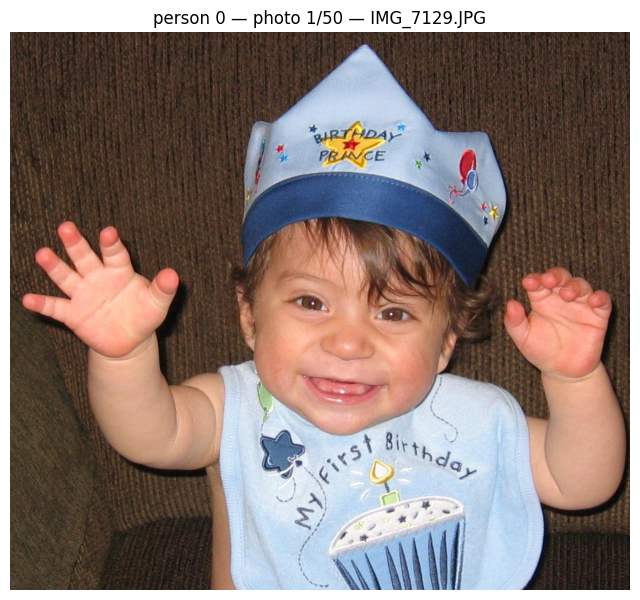

In [31]:
path = people_photos[0][0]
img = load_image(path)
if img is None:
    raise FileNotFoundError(f"could not load {path}")
show_image(img, title=f"person {0} — photo {0+1}/{len(photos)} — {path.name}")


In [32]:
candidates = [
    "a baby wearing a birthday crown"]


In [36]:
from PIL import Image

# Recover preprocess transform we discarded earlier — loads from cache, no re-download.
_, _, preprocess = open_clip.create_model_and_transforms("ViT-B-32", pretrained="openai")

# Re-use the same `path` from your previous cell. CLIP wants RGB PIL; load_image gives BGR numpy.
img_bgr    = load_image(path)
img_pil    = Image.fromarray(cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB))
img_tensor = preprocess(img_pil).unsqueeze(0).to(device)   # (1, 3, 224, 224)

with torch.no_grad():
    img_emb = model.encode_image(img_tensor)
    img_emb = img_emb / img_emb.norm(dim=-1, keepdim=True)

img_emb_np = img_emb.cpu().numpy().squeeze(0)              # (512,) numpy

# Both vectors are L2-normalized → dot product = cosine similarity.
sim = float(img_emb_np @ text_emb_np)
print(f"similarity( image , '{text}' ) = {sim:.3f}")

# Rough interpretation thresholds for OpenAI ViT-B/32 on personal photos:
#   sim > 0.30   strongly related (e.g. cake, candles, people, decorations)
#   0.22-0.30   loosely related (e.g. people indoors at a gathering)
#   < 0.22      unrelated
print("MATCH" if sim >= 0.35 else "NO MATCH")
print(sim)


similarity( image , 'A close-up photograph of a smiling baby boy wearing a light blue fabric crown that says Birthday Prince and a matching light blue bib that reads 'My First Birthday' with a cupcake illustration, holding his hands up with a joyful expression against a brown background.' ) = 0.329
NO MATCH
0.32894766330718994


In [29]:
with torch.no_grad():
    tokens = tokenizer(candidates).to(device)
    text_embs = model.encode_text(tokens)
    text_embs = text_embs / text_embs.norm(dim=-1, keepdim=True)

sims = (text_embs.cpu().numpy() @ img_emb_np)
for prompt, s in sorted(zip(candidates, sims), key=lambda x: -x[1]):
    print(f"  {s:.3f}  {prompt}")


  0.284  a baby wearing a birthday crown


In [37]:
!pip install -q google-genai pydantic



[notice] A new release of pip is available: 25.3 -> 26.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [38]:
from google import genai
from pydantic import BaseModel


In [40]:
# Get a free key at https://aistudio.google.com/apikey (no credit card).
# Either paste it below or set the GEMINI_API_KEY env var and drop the api_key arg.
client = genai.Client(api_key="AQ.Ab8RN6KYmYkGYysy3M0rrjP5sf9wfDAX64b29xH1ut0gO6llkA")

# 1) Plain text — sanity check that the API works.
resp = client.models.generate_content(
    model="gemini-2.5-flash",
    contents="In one sentence, what is a face embedding?",
)
print("--- text output ---")
print(resp.text)


# 2) Constrained output — define a schema, get back a validated object.
class PhotoTags(BaseModel):
    event: str
    people_count: int
    indoor_or_outdoor: str
    notable_objects: list[str]

resp = client.models.generate_content(
    model="gemini-2.5-flash",
    contents="A toddler wearing a 'Birthday Prince' crown and a 'My First Birthday' bib, smiling with hands raised.",
    config={
        "response_mime_type": "application/json",
        "response_schema": PhotoTags,
    },
)
tags: PhotoTags = resp.parsed   # already validated by Pydantic — no JSON parsing
print("\n--- structured output ---")
print(tags)
print(f"event = {tags.event!r}, notable_objects = {tags.notable_objects}")

--- text output ---
A face embedding is a numerical vector that captures the unique characteristics of a face, allowing for efficient comparison and identification.

--- structured output ---
event='Birthday' people_count=1 indoor_or_outdoor='indoor' notable_objects=['Birthday Prince crown', 'My First Birthday bib']
event = 'Birthday', notable_objects = ['Birthday Prince crown', 'My First Birthday bib']


In [43]:
from typing import Optional
from pydantic import BaseModel


class PhotoQuery(BaseModel):
    date_time: Optional[str] = None      # ISO 8601 if extractable ("2024-06-05" or "2024-06-05T18:00")
    location:  Optional[str] = None      # place / setting ("backyard", "Disneyland")
    names:     Optional[list[str]] = None
    caption:   Optional[str] = None      # CLIP-friendly "a photo of ..." visual phrase


def parse_description(description: str) -> PhotoQuery:
    """Parse a free-form photo description into structured fields.

    Fields not present in the input come back as None. The caption is shaped
    for CLIP retrieval — pass it straight to `tokenizer([q.caption])`.
    """
    prompt = f"""Extract structured fields from a user's photo description.

Rules:
- date_time: ISO 8601 ("2024-06-05" or "2024-06-05T18:00") if a date/time is 
  mentioned, else null. Do not invent.
- location: short place name or setting ("backyard", "Disneyland"), else null.
- names: list of explicit person names, else null. Do not invent names.
- caption: CLIP-style visual phrase in "a photo of ..." form — describe ONLY 
  what would be visible (subjects, objects, setting). No names, dates, or 
  emotions. Null only if the input has no visual content.

Description: {description}"""

    resp = client.models.generate_content(
        model="gemini-2.0-flash",
        contents=prompt,
        config={
            "response_mime_type": "application/json",
            "response_schema": PhotoQuery,
        },
    )
    return resp.parsed


# Try a few
for desc in [
    "Sarah's birthday party at our backyard on June 5 2024, John was there too",
    "find photos of Mom",
    "sunset over the beach in Maui last summer",
]:
    q = parse_description(desc)
    print(f"\nin:  {desc}\nout: {q}")


ClientError: 429 RESOURCE_EXHAUSTED. {'error': {'code': 429, 'message': 'You exceeded your current quota, please check your plan and billing details. For more information on this error, head to: https://ai.google.dev/gemini-api/docs/rate-limits. To monitor your current usage, head to: https://ai.dev/rate-limit. \n* Quota exceeded for metric: generativelanguage.googleapis.com/generate_content_free_tier_input_token_count, limit: 0, model: gemini-2.0-flash\n* Quota exceeded for metric: generativelanguage.googleapis.com/generate_content_free_tier_requests, limit: 0, model: gemini-2.0-flash\n* Quota exceeded for metric: generativelanguage.googleapis.com/generate_content_free_tier_requests, limit: 0, model: gemini-2.0-flash\nPlease retry in 11.780598752s.', 'status': 'RESOURCE_EXHAUSTED', 'details': [{'@type': 'type.googleapis.com/google.rpc.Help', 'links': [{'description': 'Learn more about Gemini API quotas', 'url': 'https://ai.google.dev/gemini-api/docs/rate-limits'}]}, {'@type': 'type.googleapis.com/google.rpc.QuotaFailure', 'violations': [{'quotaMetric': 'generativelanguage.googleapis.com/generate_content_free_tier_input_token_count', 'quotaId': 'GenerateContentInputTokensPerModelPerMinute-FreeTier', 'quotaDimensions': {'location': 'global', 'model': 'gemini-2.0-flash'}}, {'quotaMetric': 'generativelanguage.googleapis.com/generate_content_free_tier_requests', 'quotaId': 'GenerateRequestsPerMinutePerProjectPerModel-FreeTier', 'quotaDimensions': {'location': 'global', 'model': 'gemini-2.0-flash'}}, {'quotaMetric': 'generativelanguage.googleapis.com/generate_content_free_tier_requests', 'quotaId': 'GenerateRequestsPerDayPerProjectPerModel-FreeTier', 'quotaDimensions': {'location': 'global', 'model': 'gemini-2.0-flash'}}]}, {'@type': 'type.googleapis.com/google.rpc.RetryInfo', 'retryDelay': '11s'}]}}